In [1]:
import pandas as pd

# indicators
import pandas_ta as ta

# for plotting
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp

In [2]:
# pipeline steps
from pipeline_steps.data_processing import load_data_for_ticker, write_processed_data

In [3]:
%matplotlib inline

<h2>Table of Contents</h2>
<ul>
    <a href='#Load-in-data'>Load in data</a><br>
    <a href='#Adding-features'>Adding features</a>
    <ul>
        <li><a href='#Adding-MACD'>Adding MACD</a></li>
        <li><a href='#Adding-SMA'>Adding SMA</a></li>
        <li><a href='#Adding-RSI'>Adding RSI</a></li>
        <li><a href='#Adding-ROC'>Adding ROC</a></li>
        <li><a href='#Adding-10-days-difference'>Adding 10 days difference</a></li>
    </ul>
    <a href='#Data-cleaning'>Data cleaning</a><br>
    <a href='#Final-plotting'>Final plotting</a><br>
    <a href='#Writing-out-data'>Writing out data</a><br>
</ul>

## Load in data

In [4]:
# processing the data of this company
ticker_symbol = 'GOOG'

Rows: 4612
Columns: 8
Date range: 2004/08/19 - 2022/12/12


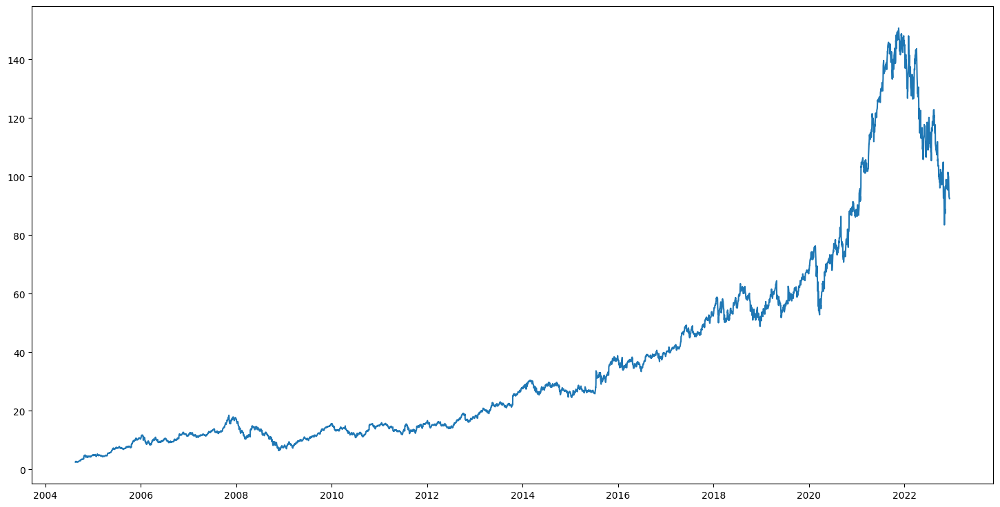

In [5]:
file = f'datasets/stock_market_data/sp500/csv/{ticker_symbol}.csv'
df = load_data_for_ticker(ticker_symbol, file, info=1)

In [6]:
df.head()

,Date,Low,Open,Volume,High,Close,Adjusted Close,ticker
Date,,,,,,,,
2004-08-19,2004-08-19,2.390042,2.490664,897427216,2.591785,2.499133,2.499133,GOOG
2004-08-20,2004-08-20,2.503118,2.515820,458857488,2.716817,2.697639,2.697639,GOOG
2004-08-23,2004-08-23,2.716070,2.758411,366857939,2.826406,2.724787,2.724787,GOOG
2004-08-24,2004-08-24,2.579581,2.770615,306396159,2.779581,2.611960,2.611960,GOOG
2004-08-25,2004-08-25,2.587302,2.614201,184645512,2.689918,2.640104,2.640104,GOOG


# Adding features

- indicators
- other self-made features

In [7]:
expanded_df = df.copy()

### Adding MACD

In [8]:
expanded_df.ta.macd(append=True)
expanded_df.tail(3)

,Date,Low,Open,Volume,High,Close,Adjusted Close,ticker,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9
Date,,,,,,,,,,,
2022-12-08,2022-12-08,93.800003,95.690002,25593200,95.870003,93.949997,93.949997,GOOG,0.182810,-0.213866,0.396676
2022-12-09,2022-12-09,93.019997,93.900002,21873700,94.489998,93.070000,93.070000,GOOG,-0.161418,-0.446475,0.285058
2022-12-12,2022-12-12,91.900002,93.089996,7626857,93.874496,92.474998,92.474998,GOOG,-0.476737,-0.609436,0.132699


#### Quick plot

In [9]:
start_date = '2019-01-01'
end_date = expanded_df.index[-1]
plotted_data = expanded_df.loc[start_date:end_date]

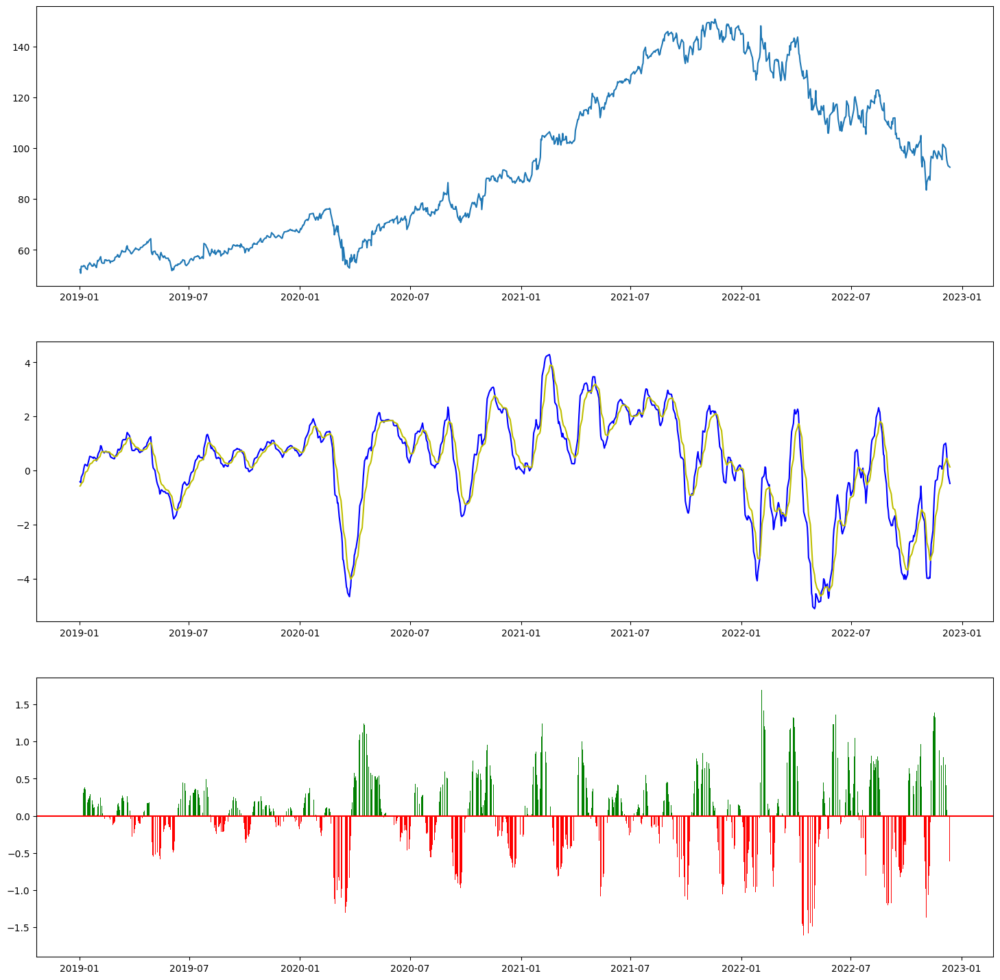

In [10]:
plt.figure(1, figsize=(18, 18))

plt.subplot(311)
plt.plot(plotted_data.loc[:, 'Adjusted Close'])

plt.subplot(312)
plt.plot(plotted_data.loc[:, 'MACD_12_26_9'], 'b') # MACD line
plt.plot(plotted_data.loc[:, 'MACDs_12_26_9'], 'y') # signal line

plt.subplot(313)
bar_color = ['g' if value > 0 else 'r' for value in plotted_data.loc[:, 'MACDh_12_26_9']]
plt.bar(
    x=plotted_data.index, 
    height=plotted_data.loc[:, 'MACDh_12_26_9'],
    color=bar_color)
plt.axhline(0, color='r')

plt.show()

### Adding SMA
https://www.investopedia.com/terms/s/sma.asp

Smooths out data, and gives a general trend of the price.

In [11]:
# the following SMAs will be added
# generally used numbers = 50, 200
sma_lengths = [50, 200]

In [12]:
for length in sma_lengths:
    expanded_df.ta.sma(length=length, append=True)
expanded_df.head(3)

,Date,Low,Open,Volume,High,Close,Adjusted Close,ticker,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9,SMA_50,SMA_200
Date,,,,,,,,,,,,,
2004-08-19,2004-08-19,2.390042,2.490664,897427216,2.591785,2.499133,2.499133,GOOG,NaN,NaN,NaN,NaN,NaN
2004-08-20,2004-08-20,2.503118,2.515820,458857488,2.716817,2.697639,2.697639,GOOG,NaN,NaN,NaN,NaN,NaN
2004-08-23,2004-08-23,2.716070,2.758411,366857939,2.826406,2.724787,2.724787,GOOG,NaN,NaN,NaN,NaN,NaN


#### Quick plot

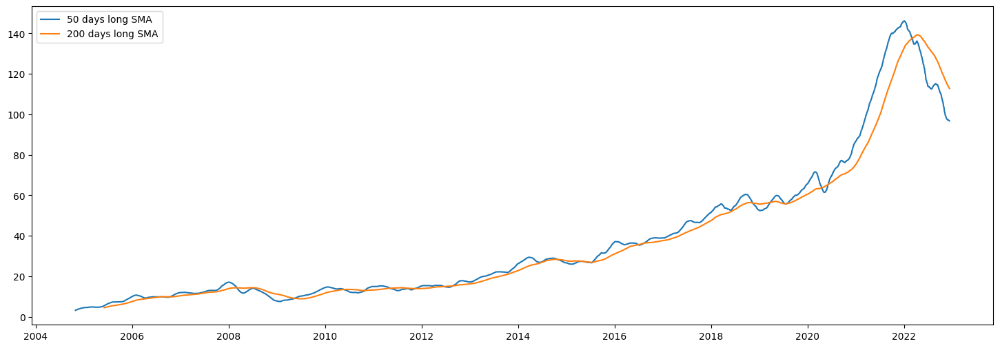

In [13]:
plt.figure(figsize=(18, 6))

for length in sma_lengths:
    plt.plot(expanded_df[f'SMA_{length}'], label=f'{length} days long SMA')

plt.legend()
plt.show()

### Adding RSI
https://www.investopedia.com/articles/active-trading/042114/overbought-or-oversold-use-relative-strength-index-find-out.asp

Shows if a stock is overbought or oversold.
- RSI < 30 => oversold, undervalued => should buy
- RSI > 70 => overbought, overvalued => should sell
- In between => neutral

In [14]:
expanded_df.ta.rsi(append=True)
expanded_df.tail(3)

,Date,Low,Open,Volume,High,Close,Adjusted Close,ticker,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9,SMA_50,SMA_200,RSI_14
Date,,,,,,,,,,,,,,
2022-12-08,2022-12-08,93.800003,95.690002,25593200,95.870003,93.949997,93.949997,GOOG,0.182810,-0.213866,0.396676,96.9546,113.204273,43.507649
2022-12-09,2022-12-09,93.019997,93.900002,21873700,94.489998,93.070000,93.070000,GOOG,-0.161418,-0.446475,0.285058,96.8542,113.006255,41.961273
2022-12-12,2022-12-12,91.900002,93.089996,7626857,93.874496,92.474998,92.474998,GOOG,-0.476737,-0.609436,0.132699,96.7807,112.796033,40.902695


#### Quick plot

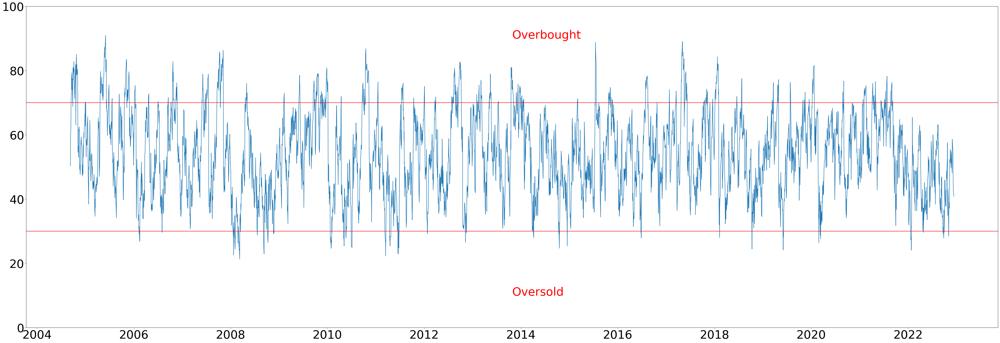

In [15]:
plt.figure(figsize=(60,20))
plt.plot(expanded_df['RSI_14'])

plt.axhline(30, color='r')
plt.axhline(70, color='r')

plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.ylim(0, 100)

plt.text(x=sum(plt.xlim())/2, y=90, 
         s='Overbought',
         color='r', fontsize=40)
plt.text(x=sum(plt.xlim())/2, y=10, 
         s='Oversold',
         color='r', fontsize=40)

plt.show()

### Adding ROC
https://www.investopedia.com/terms/p/pricerateofchange.asp

Momentum indicator, that shows the precentage change between the current and the price X periods before.

Shows trends:
- positive ROC => uptrend
- negative ROC => downtrend

In [16]:
# generally used numbers = 14
expanded_df.ta.roc(length=14, append=True)
expanded_df.tail(3)

,Date,Low,Open,Volume,High,Close,Adjusted Close,ticker,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9,SMA_50,SMA_200,RSI_14,ROC_14
Date,,,,,,,,,,,,,,,
2022-12-08,2022-12-08,93.800003,95.690002,25593200,95.870003,93.949997,93.949997,GOOG,0.182810,-0.213866,0.396676,96.9546,113.204273,43.507649,-4.619292
2022-12-09,2022-12-09,93.019997,93.900002,21873700,94.489998,93.070000,93.070000,GOOG,-0.161418,-0.446475,0.285058,96.8542,113.006255,41.961273,-4.836404
2022-12-12,2022-12-12,91.900002,93.089996,7626857,93.874496,92.474998,92.474998,GOOG,-0.476737,-0.609436,0.132699,96.7807,112.796033,40.902695,-3.500995


#### Quick plot

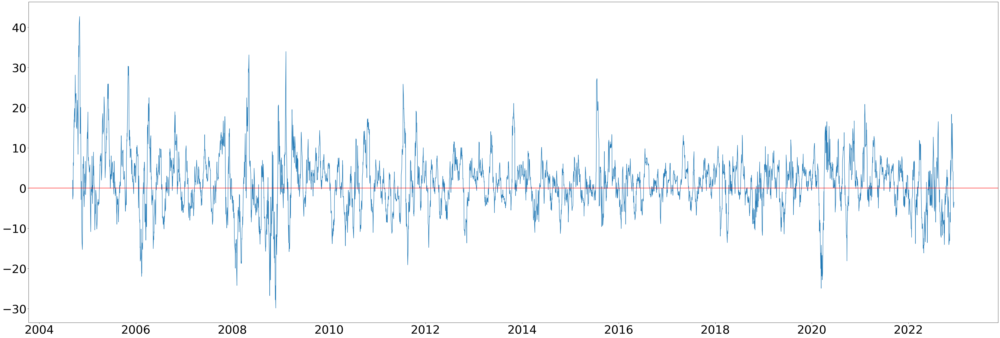

In [17]:
plt.figure(figsize=(60,20))

plt.plot(expanded_df['ROC_14'])

plt.axhline(0, color='r')

plt.xticks(fontsize=40)
plt.yticks(fontsize=40)

plt.show()

In [18]:
# TODO:
# EMA, BBand, mom, cci, moving average crossovers
# default values should be used (yahoo finance, investing.com)

## Adding target: 10 period difference
We will take the next n periods avarage closing price, and them subtract the current day's closing price from it.

**This will be the feature that we are trying to predict, so this feature should be added as the last feature to the dataframe!**

In [19]:
difference_range = 10 # values in the future

In [20]:
def calc_target(batch):
    batch = batch.to_numpy()
    # note: the batch is reversed!
    current_value = batch[0]
    future_values = batch[1:]
    
    return future_values[-1] - current_value
    #sum(future_values)/len(future_values) - current_value


def create_target_column(column):
    reversed_col = column[::-1]
    
    # go through the column with the window
    result = reversed_col.rolling(window=difference_range+1).apply(lambda x: calc_target(x[::-1]))
    
    # reverse it back
    return result[::-1]

In [21]:
target_name = f'DIFF_{difference_range}'

In [22]:
expanded_df[target_name] = create_target_column(expanded_df['Close'])
expanded_df[:5][['Close', target_name]]

,Close,DIFF_10
Date,,
2004-08-19,2.499133,0.029140
2004-08-20,2.697639,-0.206726
2004-08-23,2.724787,-0.194770
2004-08-24,2.611960,-0.064010
2004-08-25,2.640104,-0.091905


## Data cleaning
TODO: could try filling missing values (with backfill)

In [23]:
print(f'Original shape: {expanded_df.shape}')
expanded_df.dropna(axis=0, inplace=True)
print(f'Resulting shape: {expanded_df.shape}')

Original shape: (4612, 16)
Resulting shape: (4403, 16)


# Final plotting

In [24]:
plotted_df = expanded_df.copy()

In [25]:
# extra variables for better plotting
shown_range_start = expanded_df.index[-1] - pd.Timedelta(days=200)
shown_range_end = expanded_df.index[-1]

# used for bar colors
plotted_df['MACDh_12_26_9_col'] = plotted_df['MACDh_12_26_9'] > 0 

### Price chart

In [26]:
# making price chart
price_chart = px.area(plotted_df, y=['Close'], title ='Close prices')
price_chart.update_xaxes(title_text='Date')
price_chart.update_yaxes(title_text='Close Price', tickprefix='$')

price_chart.show()

### MACD indicator

In [27]:
fig = go.Figure()

# adding macd line
fig.add_trace(
    go.Scatter(
        x=plotted_df['Date'], 
        y=plotted_df['MACD_12_26_9'],
        name='MACD line',
        line_color='blue'
    )
)

# adding signal line
fig.add_trace(
    go.Scatter(
        x=plotted_df['Date'], 
        y=plotted_df['MACDs_12_26_9'],
        name='Signal line',
        line_color='orange'
    )
)

# adding bars
bar_chart = px.bar(plotted_df,
                    x='Date',
                    y='MACDh_12_26_9',
                    color='MACDh_12_26_9_col',
                    color_discrete_map={True: 'green', False: 'red'},
                    range_x=[shown_range_start, shown_range_end])
fig.add_trace(bar_chart.data[0]) # negative (red) bars
fig.add_trace(bar_chart.data[1]) # positive (green) bars
# we don't want their legends
fig.update_traces(selector=dict(name='False'), showlegend=False)
fig.update_traces(selector=dict(name='True'), showlegend=False)

fig.update_xaxes(
    title_text='Date', 
    range=[shown_range_start, shown_range_end]
)

fig.update_layout(
    title='MACD indicator',   
    title_x=0.5,
    bargap=0)

fig.show()

#### Multiple indicators

In [28]:
# creating a figure wiht subplots for all the different indicators
fig = sp.make_subplots(
    rows=4, cols=1, 
    shared_xaxes=True, 
    row_heights=[0.60, 0.10, 0.15, 0.15],
    vertical_spacing=0.03)

In [29]:
# Closing prices
close_pos = (1, 1)

fig.add_trace(
    go.Scatter(
         x=plotted_df['Date'], 
         y=plotted_df['Close'],
         name='Closing price',
         line_color='blue',
    ),
    row=close_pos[0], col=close_pos[0]
)
fig.update_yaxes(
    title_text='Close Price', 
    tickprefix='$',
    row=close_pos[0], col=close_pos[0]
)

# SMA
sma_names = []
for length in sma_lengths:
    sma_names.append(f'SMA_{length}')
# creating SMA lines
SMA_lines = px.line(
    plotted_df, 
    x='Date', 
    y=sma_names)
# adding lines to figure
for i in range(len(sma_lengths)):
    fig.add_trace(
        SMA_lines.data[i],
        row=close_pos[0], col=close_pos[0])
    fig.update_traces(
        name=f'{sma_lengths[i]} days long SMA', 
        selector=dict(name=SMA_lines.data[i].name), 
        row=close_pos[0], col=close_pos[0])
    
print('Closing price and SMAs have been added to first subplot!')

Closing price and SMAs have been added to first subplot!


In [30]:
# RSI
rsi_pos = (3,1)

fig.add_trace(
    go.Scatter(
        x=plotted_df['Date'], 
        y=plotted_df['RSI_14'],
        name='RSI',
        line_color='orange'),
    row=rsi_pos[0], col=rsi_pos[1]
)
# adding horizontal lines
line_y_positions = [30, 70]
for y_position in line_y_positions:
    fig.add_shape(
        type='line',
        x0=expanded_df.index[0], x1=expanded_df.index[-1],
        y0=y_position, y1=y_position,
        line=dict(color='red', width=2),
        row=rsi_pos[0], col=rsi_pos[1]
    )
# changing y range
fig.update_yaxes(range=[0, 100], row=rsi_pos[0], col=rsi_pos[1])

print('RSI added to second subplot!')

RSI added to second subplot!


In [31]:
# ROC
roc_pos = (4,1)

fig.add_trace(
    go.Scatter(
        x=plotted_df['Date'], 
        y=plotted_df['ROC_14'],
        name='ROC',
        line_color='brown'),
    row=roc_pos[0], col=roc_pos[1]
)

print('ROC added to first subplot!')

ROC added to first subplot!


In [32]:
# changing x axis to a specified range
fig.update_xaxes(
    range=[shown_range_start, shown_range_end]
)

# general settings
fig.update_layout(
    title='Indicator plot',
    height=1200,
    title_x=0.5,
    hovermode='x unified',
    xaxis_rangeslider_visible=True,
    xaxis_rangeslider_thickness=0.1
)

# showing a pretty plot
fig.show()

In [33]:
# TODO
# add more indicator plots
# add better legends (also better positions)
# add titles for each subplot
# llok into using dash, for more interactivity

## Writing out data

In [34]:
expanded_df.head()

,Date,Low,Open,Volume,High,Close,Adjusted Close,ticker,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9,SMA_50,SMA_200,RSI_14,ROC_14,DIFF_10
Date,,,,,,,,,,,,,,,,
2005-06-03,2005-06-03,6.909352,7.142976,754108027,7.205492,6.980336,6.980336,GOOG,0.449593,0.075923,0.373670,5.466899,4.469567,79.570214,22.256154,0.000996
2005-06-06,2005-06-06,7.019439,7.033387,904413304,7.316327,7.246339,7.246339,GOOG,0.467185,0.074812,0.392373,5.522535,4.493303,82.771400,25.920792,-0.105604
2005-06-07,2005-06-07,7.230399,7.399764,976566743,7.461781,7.300635,7.300635,GOOG,0.479975,0.070082,0.409893,5.578177,4.516318,83.345063,25.732409,-0.131507
2005-06-08,2005-06-08,6.924047,7.293911,1031889331,7.302379,6.962901,6.962901,GOOG,0.457585,0.038153,0.419432,5.627985,4.537509,68.145384,16.892449,0.242591
2005-06-09,2005-06-09,6.987808,7.091420,660109011,7.185567,7.131021,7.131021,GOOG,0.448239,0.023046,0.425193,5.680717,4.560104,70.982302,19.704824,0.084683


In [35]:
write_processed_data(expanded_df, info=1)

File written out: 2023_09_16_18_55_55.csv
Path to file: datasets/processed_data/GOOG/
